# Исследование рынка заведений общественного питания Москвы

**Ход исследования**

В нашем распоряжении датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Перед анализом предстоит изучить общую информацию о датасете, найти и обработать пропуски, где это необходимо, изучить дубликаты, понять сколько заведений представлено, какая информация есть в столбцах датасета и какого типа данные в них хранятся.

Таким образом, исследование пройдёт в пять этапов:
 1. Обзор данных.
 2. Предобработка данных.
 3. Исследовательский анализ данных.
 4. Детализация исследованние: открытие кофейни.
 5. Презентация пректа.
 
 **Цель исследования** — подготовить исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места для открытия кафе, ресторана, пиццерии, паба или бара. 


### Обзор файла с данными и изучение общей информации. 

In [1]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import seaborn as sns
sns.set(rc={'figure.figsize':(12, 10)})
sns.set_color_codes('pastel')
sns.set_style('darkgrid')
import json
import warnings
warnings.simplefilter('ignore')

In [2]:
places_to_eat = pd.read_csv('/datasets/moscow_places.csv')
places_to_eat.head(15)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [3]:
places_to_eat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Нам предстоит исследовать 8406 заведений общественного питания Москвы. 

Для анализа у нас есть 14 столбцов со следующей информацией (файл moscow_places.csv):

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека;
- middle_coffee_cup — число с оценкой одной чашки капучино;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым; 
- district — административный район, в котором находится заведение;
- seats — количество посадочных мест.

Значения датасета хранят значения с тремя типами данных: категориальный, целые числа, вещественные числа.

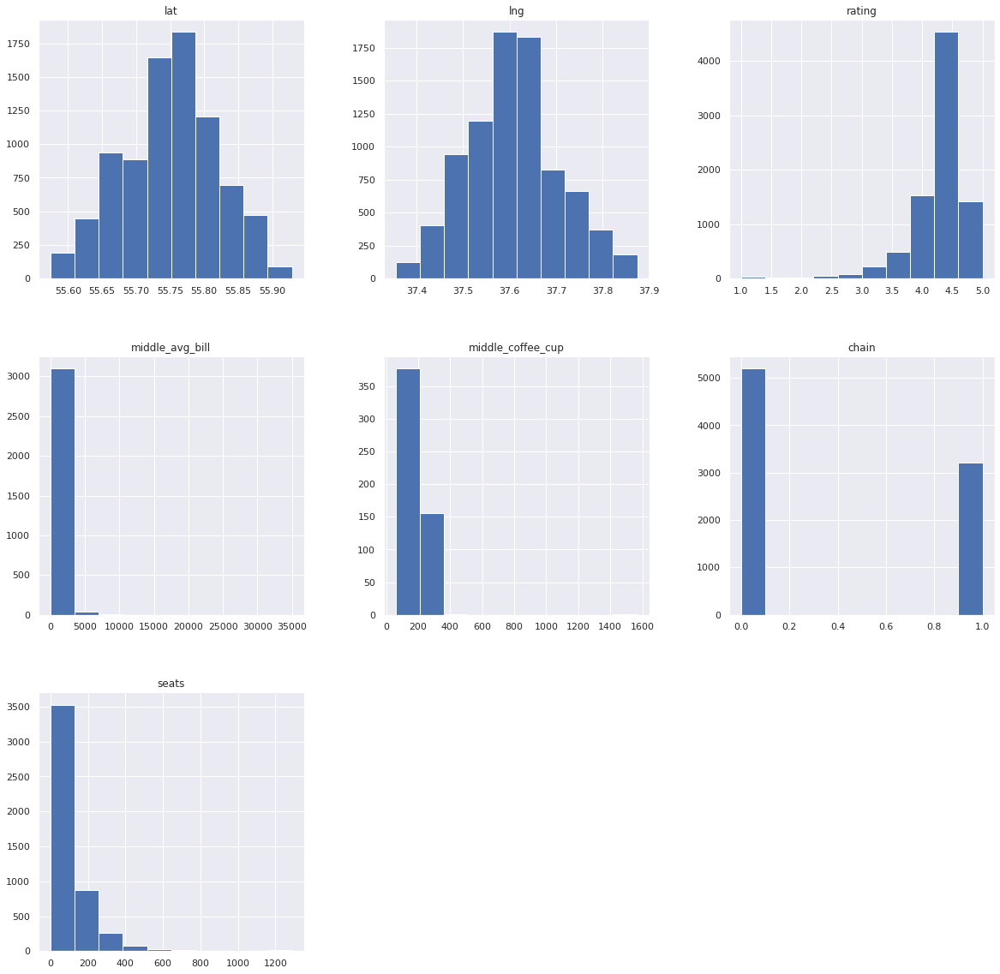

In [4]:
places_to_eat.hist(figsize=(20, 20));

Судя по гистограммам, можно заметить следующие особенности заведений:

- Рейтинг большинства заведений находится в районе 4.5;
- Средний чек чаще всего не превышает 4000 рублей;
- В среднем чашка капучино стоит не дороже 200 рублей;
- Несетевые заведения превалируют на сетевыми;
- В основном количество посадочных мест в районе 100.

### Предобработка данных

#### Обработка пропусков и дубликатов

In [5]:
pd.DataFrame(round(places_to_eat.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


In [6]:
print(f'Количество полных дубликатов: {places_to_eat.duplicated().sum()}')

Количество полных дубликатов: 0


In [7]:
places_to_eat['name'] = places_to_eat['name'].replace(' ', '')
places_to_eat['name'] = places_to_eat['name'].replace('_', '')
places_to_eat['name'] = places_to_eat['name'].replace('ё', 'е')
places_to_eat['name'] = places_to_eat['name'].replace('»', '')
places_to_eat['name'] = places_to_eat['name'].replace('«', '')
places_to_eat['name'] = places_to_eat['name'].str.strip()
places_to_eat['address'] = places_to_eat['address'].replace('ё', 'е')
places_to_eat['address'] = places_to_eat['address'].str.strip()

In [8]:
 places_to_eat[places_to_eat.duplicated(subset=['name', 'address'])].sum()

name                 0.0
category             0.0
address              0.0
district             0.0
hours                0.0
lat                  0.0
lng                  0.0
rating               0.0
price                0.0
avg_bill             0.0
middle_avg_bill      0.0
middle_coffee_cup    0.0
chain                0.0
seats                0.0
dtype: float64

In [9]:
places_to_eat['name'].duplicated().sum()

2792

In [10]:
places_to_eat['name'].value_counts().head(20)

Кафе                                   189
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
Шаурма                                  43
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Ресторан                                34
Буханка                                 32
CofeFest                                32
Столовая                                28
Му-Му                                   27
Drive Café                              24
Name: name, dtype: int64

In [11]:
places_to_eat['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [12]:
places_to_eat['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [13]:
places_to_eat['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [14]:
places_to_eat['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [15]:
places_to_eat['avg_bill'].unique()

array([nan, 'Средний счёт:1500–1600 ₽', 'Средний счёт:от 1000 ₽',
       'Цена чашки капучино:155–185 ₽', 'Средний счёт:400–600 ₽',
       'Средний счёт:199 ₽', 'Средний счёт:200–300 ₽',
       'Средний счёт:от 500 ₽', 'Средний счёт:1000–1200 ₽',
       'Цена бокала пива:250–350 ₽', 'Средний счёт:330 ₽',
       'Средний счёт:1500 ₽', 'Средний счёт:300–500 ₽',
       'Средний счёт:140–350 ₽', 'Средний счёт:350–500 ₽',
       'Средний счёт:300–1500 ₽', 'Средний счёт:от 240 ₽',
       'Средний счёт:200–250 ₽', 'Средний счёт:328 ₽',
       'Средний счёт:300 ₽', 'Средний счёт:от 345 ₽',
       'Средний счёт:60–400 ₽', 'Средний счёт:900 ₽',
       'Средний счёт:500–800 ₽', 'Средний счёт:500–1000 ₽',
       'Средний счёт:600–700 ₽', 'Цена бокала пива:120–350 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1500–2000 ₽',
       'Цена чашки капучино:150–190 ₽', 'Средний счёт:2000–2500 ₽',
       'Средний счёт:600 ₽', 'Средний счёт:450 ₽',
       'Цена чашки капучино:120–170 ₽', 'Средний счё

In [16]:
places_to_eat['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [17]:
places_to_eat['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [18]:
places_to_eat.loc[places_to_eat['price'] == 'средние'].sort_values(by='middle_avg_bill', ascending=True).head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8162,Хинкальная Рачули,"бар,паб","Москва, улица Серпуховский Вал, 3",Южный административный округ,"ежедневно, 11:00–23:00",55.711108,37.618759,4.2,средние,Средний счёт:от 165 ₽,165.0,NaN,0,48.0
7803,Столовая - буфетъ,столовая,"Москва, улица Подольских Курсантов, 5",Южный административный округ,пн-пт 08:00–20:00,55.611558,37.618040,4.5,средние,Средний счёт:140–250 ₽,195.0,NaN,0,50.0
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7289,Сим Сити Бакинские Каникулы,пиццерия,"Москва, Братиславская улица, 20",Юго-Восточный административный округ,"ежедневно, 12:00–02:00",55.656527,37.761352,4.2,средние,Средний счёт:от 199 ₽,199.0,NaN,0,60.0
5033,Абракадабра,кафе,"Москва, Большая Серпуховская улица, 17, стр. 1",Центральный административный округ,"ежедневно, 10:00–22:00",55.726949,37.626176,4.7,средние,Средний счёт:180–220 ₽,200.0,NaN,0,60.0


In [19]:
places_to_eat.loc[places_to_eat['price'] == 'низкие'].sort_values(by='middle_avg_bill', ascending=False).head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8137,Кафетериус № 3,кафе,"Москва, Волгоградский проспект, 32, корп. 11, ...",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.722897,37.692927,4.2,низкие,Средний счёт:500–700 ₽,600.0,NaN,0,206.0
3641,Кулинарная лавка братьев Караваевых,кафе,"Москва, Тверской бульвар, 20, стр. 4",Центральный административный округ,"ежедневно, 08:00–23:00",55.761108,37.602934,4.4,низкие,Средний счёт:500–650 ₽,575.0,NaN,1,145.0
3854,Prime,ресторан,"Москва, Тверская улица, 15",Центральный административный округ,"пн-пт 07:00–22:00; сб,вс 08:00–22:00",55.762555,37.607843,4.2,низкие,Средний счёт:500–650 ₽,575.0,NaN,1,35.0
784,Теремок,ресторан,"Москва, Дмитровское шоссе, 89",Северный административный округ,"ежедневно, 10:00–22:00",55.864064,37.544925,4.4,низкие,Средний счёт:450–600 ₽,525.0,NaN,1,55.0
1420,Prime,ресторан,"Москва, Ленинградский проспект, 72, корп. 4",Северный административный округ,пн-пт 07:00–20:00,55.805408,37.519895,4.2,низкие,Средний счёт:400–650 ₽,525.0,NaN,1,67.0


Анализ количества пропусков показал, что в данных встречаются пропуски в следующих столбцах:
- Часы и дни работы - 6%;
- Категория цен - 61%;
- Средняя стоимость заказа в виде диапазона - 63%;
- Средний чек - 55%;
- Средний чек чашки капучино - 94%;
- Количество посадочных мест - 43%.

Но несмотря на значительное количество пропусков в некоторых столбцах, обрабатывать их будет некорректно, так как никаких инструментов точного восстановления данных у нас нет.

Полных дубликатов в ходе предоработки данных выявлено не было. Дубликаты встречаются в столбце с названиями заведений, но большинство из них - это сетевые заведения. Помимо этого названия могут просто совпадать, поэтому эти дубликаты оставим как есть. Дубликаты так же встречаются в колонке с адресами, но это тоже не удивительно, по одному адресу может находиться несколько мест общепита, особенно если они относятся к разным категориям. 

Были просмотрены уникальные значения следующих столбцов с категориальными данными: категории, округ, часы работы, средный счет в диапазоне. Результаты дубликатов не показали, данные готовы к анализу. Также, судя по построенным гистограммам, в данных в  столбцах с количественными значениями, такие как рейтинг, количество посадочных мест, средний чек, средний чек за чашку капучино и число,выражающее является ли заведение сетевым, аномалий не выявлено.

#### Создание новых столбцов

In [20]:
places_to_eat['street'] = places_to_eat['address'].str.split(",").str[1]
places_to_eat['street'] = places_to_eat['street'].str.strip()
places_to_eat

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица


In [21]:
def is_247_func(row):
    
    hours = row['hours']
    if hours == 'ежедневно, круглосуточно':
        return True
    else:
        return False

places_to_eat['is_24_7']  = places_to_eat.apply(is_247_func, axis=1)
places_to_eat

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


Для дальнейшего анализа данных были созданы два новых столбца: с указанием улицы, на которой находится заведение и столбец, хранящий информацию о том, является ли заведение круглосуточным и работающим ежедневно или нет.

###  Исследовательский анализ данных

#### Исследование категорий заведений

In [22]:
places_to_eat['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [23]:
places_to_eat_category = (
    places_to_eat.groupby('category')['name']
    .count()
    .reset_index()
    .rename(columns={'name':'total'})
    .sort_values(by='total', ascending=False)
)
places_to_eat_category

,category,total
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


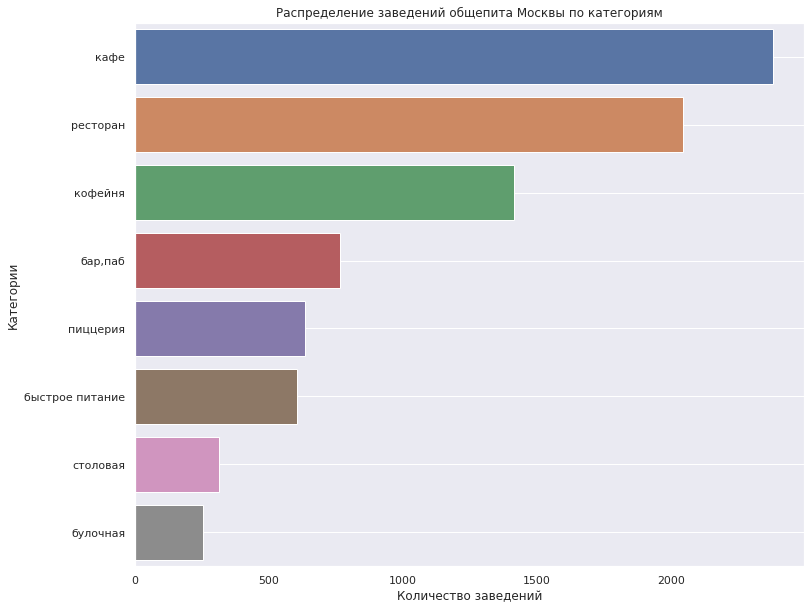

In [24]:
ax = sns.barplot(x='total', y='category', data=places_to_eat_category) 
plt.title('Распределение заведений общепита Москвы по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категории')
plt.grid()
plt.show()

Среди категорий заведений общественного питания Москвы лидерами по количеству стали:

- кафе(28.3%)
- рестораны(24.3%)
- кофейни(16.8%)

А вот булочных в Москве всего 3%. Это Вам не Санкт-Петербург.

#### Исследование количества посадочных мест

In [25]:
total_seats = (
    places_to_eat.groupby('category')['seats']
    .count()
    .reset_index()
    .sort_values(by='seats')
)
total_seats.columns = ['category','total_seats']
total_seats

,category,total_seats
1,булочная,148
7,столовая,164
2,быстрое питание,349
5,пиццерия,427
0,"бар,паб",468
4,кофейня,751
3,кафе,1218
6,ресторан,1270


In [26]:
places_to_eat_seats = (
    places_to_eat.groupby('category')['name', 'seats']
    .agg({'name':'count','seats':'median'})
    .round()
    .reset_index()
)
places_to_eat_seats.columns = ['category', 'total_places', 'seats_median']
places_to_eat_seats

,category,total_places,seats_median
0,"бар,паб",765,82.0
1,булочная,256,50.0
2,быстрое питание,603,65.0
3,кафе,2378,60.0
4,кофейня,1413,80.0
5,пиццерия,633,55.0
6,ресторан,2043,86.0
7,столовая,315,76.0


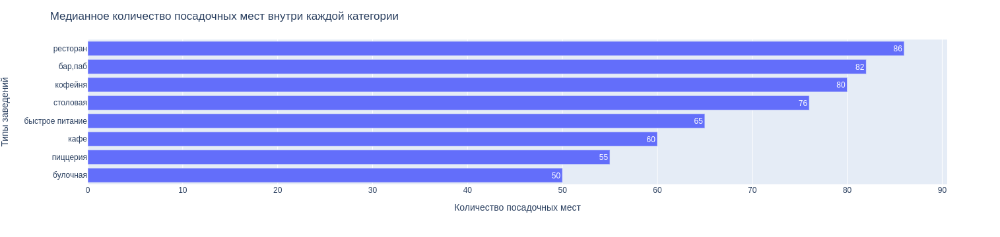

In [27]:
# строим столбчатую диаграмму 
fig = px.bar(places_to_eat_seats.sort_values(by='seats_median', ascending=True), 
             x='seats_median', 
             y='category', 
             text='seats_median'                      
            )
# оформляем график
fig.update_layout(title='Медианное количество посадочных мест внутри каждой категории',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Типы заведений')
fig.show() 

In [28]:
places_to_eat.groupby('category')['seats'].describe().sort_values(by='50%', ascending=False).reset_index()

,category,count,mean,std,min,25%,50%,75%,max
0,ресторан,1270.0,121.944094,123.757335,0.0,48.00,86.0,150.0,1288.0
1,"бар,паб",468.0,124.532051,145.011574,0.0,48.00,82.5,150.0,1288.0
2,кофейня,751.0,111.199734,127.837772,0.0,40.00,80.0,144.0,1288.0
3,столовая,164.0,99.750000,122.951453,0.0,40.00,75.5,117.0,1200.0
4,быстрое питание,349.0,98.891117,106.611739,0.0,28.00,65.0,140.0,1040.0
5,кафе,1218.0,97.512315,117.985084,0.0,35.25,60.0,120.0,1288.0
6,пиццерия,427.0,94.496487,112.282703,0.0,30.00,55.0,120.0,1288.0
7,булочная,148.0,89.385135,97.685844,0.0,25.00,50.0,120.0,625.0


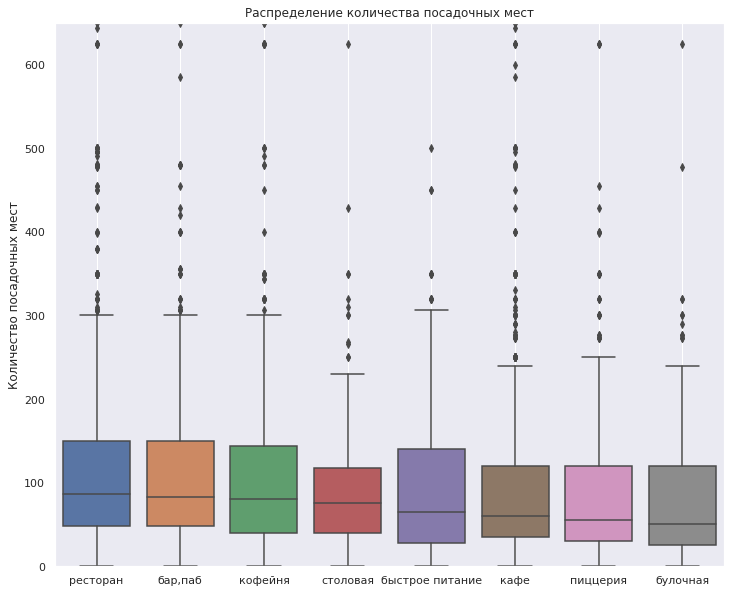

In [29]:
grouped_seats = (places_to_eat.groupby('category')
                              .agg(median_seats=('seats', 'median'))
                              .sort_values(by='median_seats', ascending=False))
sns.boxplot(y=places_to_eat['seats'], x=places_to_eat['category'], order=grouped_seats.index)
plt.xlabel('')
plt.ylabel('Количество посадочных мест')
plt.ylim(0, 650)
plt.grid()
plt.title('Распределение количества посадочных мест')
plt.show()

Исследования показали, что суммарно общее количество посадочных мест больше в ресторанах и кафе, меньше всего в булочных и столовых. Анализируя медианные значения посадочных мест в каждой категории, было выявлено, что больше всего посадочных мест обычно в пабах, ресторанах и кофейнях - в среднем 125, 122 и 111 мест соответственно. В столовых, заведениях быстрого питания и кафе в среднем примерно одинаковое количество - 100, 99 и 98 соответственно. В пиццериях и булочных мест чуть меньше, но не сказать, чтобы их было мало, в целом разброс не большой.

#### Cоотношение сетевых и несетевых заведений 

In [30]:
chain_places = (
    places_to_eat.groupby('chain')['name']
    .count()
    .sort_values(ascending=False)
    .reset_index()
)
chain_places.columns = ['chain', 'total']
chain_places['ratio'] = (chain_places['total'] / chain_places['total'].sum()).round(1)
chain_places

,chain,total,ratio
0,0,5201,0.6
1,1,3205,0.4


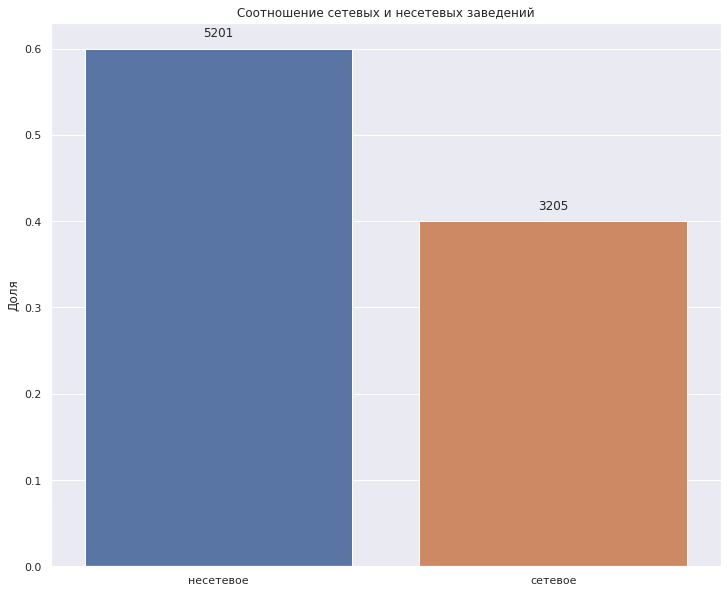

In [31]:
# переименуем категории в датафрейме
chain_places['chain'] = chain_places['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')

# строим график
ax = sns.barplot(x='chain',y='ratio', data=chain_places)
plt.title('Cоотношение сетевых и несетевых заведений')
plt.xlabel(''), plt.ylabel('Доля')

# создаем подписи столбцов
rects = ax.patches
labels = chain_places['total'].to_list()

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 0.01, label, ha="center", va="bottom"
    )

# выводим график    
plt.show()

В ходе анализа было выявлено, что лишь 40% заведений общественного питания являются сетевыми, это 3205 места.

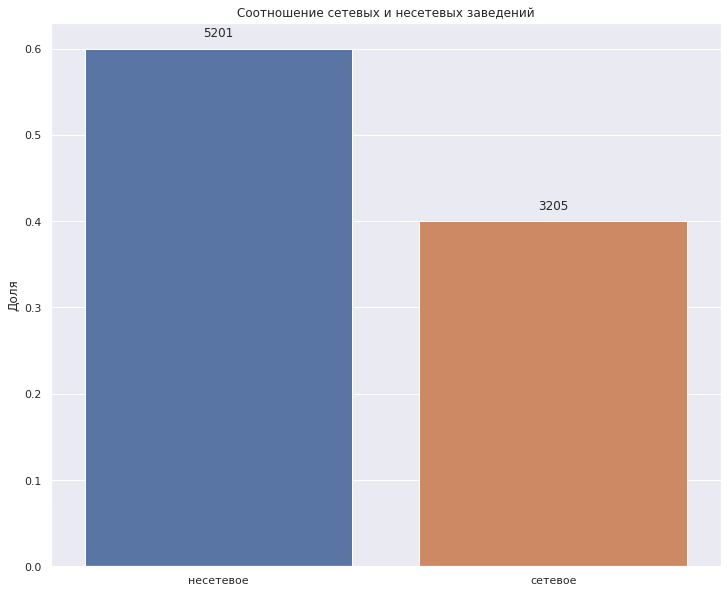

In [32]:
# переименуем категории в датафрейме
#chain_places['chain'] = chain_places['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')

# строим график
ax = sns.barplot(x='chain',y='ratio', data=chain_places)
plt.title('Cоотношение сетевых и несетевых заведений')
plt.xlabel(''), plt.ylabel('Доля')

# создаем подписи столбцов
rects = ax.patches
labels = chain_places['total'].to_list()

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height + 0.01, label, ha="center", va="bottom"
    )

# выводим график    
plt.show()

#### Доля сетевых заведений внутри категории

In [33]:
chain_type = places_to_eat.pivot_table(index = 'category', values='name', columns = 'chain', aggfunc='count').reset_index()
chain_type.columns = ['category', 'is_not_chain', 'is_chain']
chain_type['total'] = chain_type['is_not_chain'] + chain_type['is_chain']
chain_type['rate_is_chain'] = (chain_type['is_chain'] / chain_type['total']).round(2)
chain_type['rate_is_not_chain'] = (chain_type['is_not_chain'] / chain_type['total']).round(2)
chain_type['percent_is_not_chain'] = chain_type['rate_is_not_chain'] * 100
chain_type['percent_is_chain'] = chain_type['rate_is_chain'] * 100
chain_type['total_in_percent'] = chain_type['percent_is_not_chain'] + chain_type['percent_is_chain']
chain_type = chain_type.sort_values(by='percent_is_chain', ascending=False)
chain_type

,category,is_not_chain,is_chain,total,rate_is_chain,rate_is_not_chain,percent_is_not_chain,percent_is_chain,total_in_percent
1,булочная,99,157,256,0.61,0.39,39.0,61.0,100.0
5,пиццерия,303,330,633,0.52,0.48,48.0,52.0,100.0
4,кофейня,693,720,1413,0.51,0.49,49.0,51.0,100.0
2,быстрое питание,371,232,603,0.38,0.62,62.0,38.0,100.0
6,ресторан,1313,730,2043,0.36,0.64,64.0,36.0,100.0
3,кафе,1599,779,2378,0.33,0.67,67.0,33.0,100.0
7,столовая,227,88,315,0.28,0.72,72.0,28.0,100.0
0,"бар,паб",596,169,765,0.22,0.78,78.0,22.0,100.0


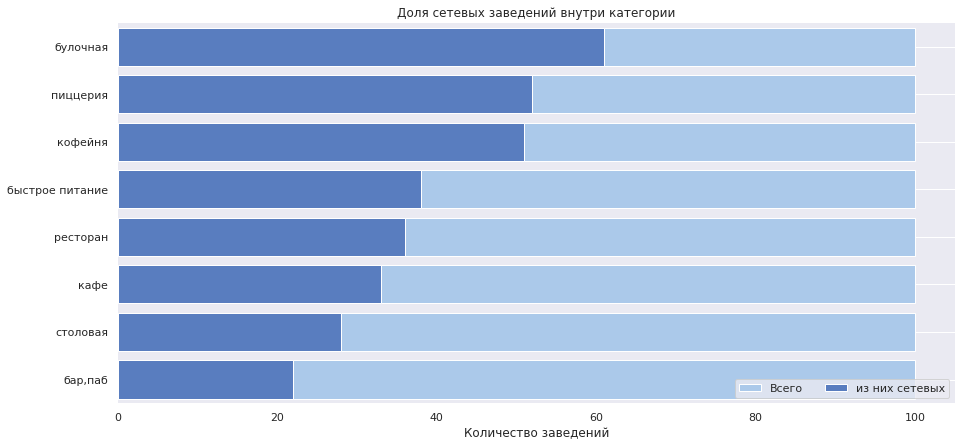

In [34]:
f, ax = plt.subplots(figsize = (15,7))
sns.set_color_codes('pastel')
sns.barplot(x = 'total_in_percent', y = 'category', data = chain_type,
            label = 'Всего', color = 'b', edgecolor = 'w')
sns.set_color_codes('muted')
sns.barplot(x = 'percent_is_chain', y = 'category', data = chain_type,
            label = 'из них сетевых', color = 'b', edgecolor = 'w')
ax.legend(ncol = 2, loc = 'lower right')
ax.set(ylabel="", xlabel="Количество заведений")
sns.despine(left = True, bottom = True)
plt.title('Доля сетевых заведений внутри категории')
plt.grid()
plt.show()

Чаще всего сетевыми заведениями в Москве являются кафе (779 заведений), рестораны (730) и кофейни (720), это 9% от общего количества заведений общепита Москвы. 4% сетевых мест - это пиццерии, а вот сетевых столовых в Москве 88, это 1% от всех имеющихся мест общепита.

Доли сетевых заведений внутри каждой категории распределены следующим образом:

- сетевыми лидерами являются: булочные - 61% от общего числа, пиццерии - 52% и кофейни - 51%;
- золотая середина досталась быстрому питанию, ресторанам и кафе (38%, 36% и 33% соответственно);
- чуть реже сетей встречается среди баров(22%) и столовых (28%).
                          

#### Исследование топа-15 популярных сетей в Москве

In [35]:
chain_top = (
    places_to_eat.query('chain == 1')
    .pivot_table(index=['name'], values='chain', aggfunc='count')
    .reset_index()
    .sort_values(by='chain', ascending=False)
    .head(15)
)
chain_top # найдем 15 самых популярных (крупных по количеству) сетей в Москве

,name,chain
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


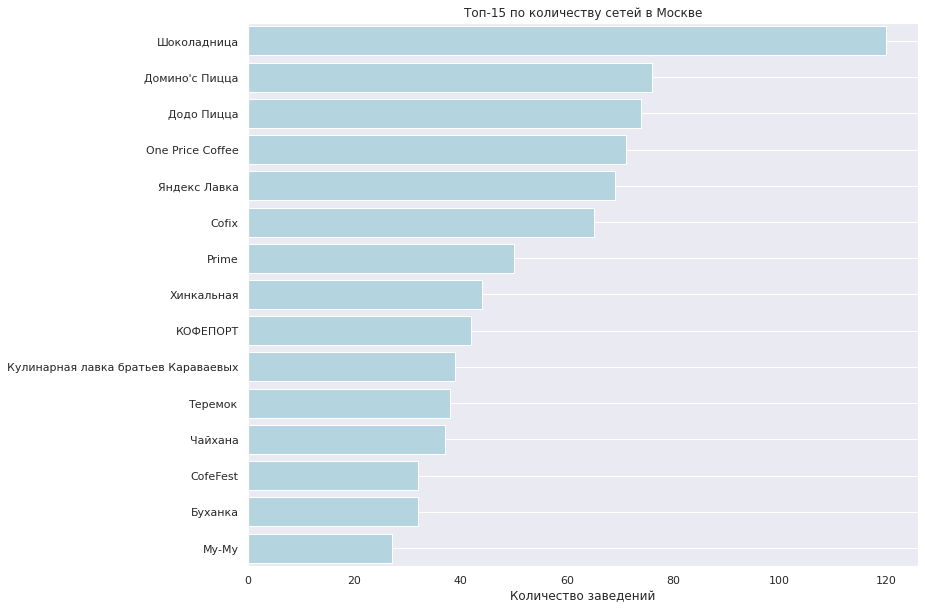

In [36]:
sns.barplot(x='chain', y='name', data=chain_top, color='lightblue')
plt.xlabel('Количество заведений')
plt.ylabel('')
plt.title('Топ-15 по количеству сетей в Москве')
plt.grid()
plt.show()

In [37]:
long = ['Центральный административный округ', 'Северный административный округ', 'Южный административный округ', 'Западный административный округ', 'Восточный административный округ', 'Юго-Восточный административный округ', 'Юго-Западный административный округ', 'Северо-Восточный административный округ', 'Северо-Западный административный округ']
short = ['ЦАО', 'САО', 'ЮАО', 'ЗАО', 'ВАО', 'ЮВАО', 'ЮСАО','СВАО','СЗАО' ]
places_to_eat['district'] = places_to_eat['district'].replace(long, short)

In [38]:
top_names = chain_top['name'].unique()

In [39]:
res = places_to_eat.query('chain == 1').query('name in @top_names')

In [40]:
chain_top_2 = (
    res.groupby(['district','category'])['name']
    .count()
    .reset_index()
    .sort_values(by='name', ascending=False)
)
chain_top_2.columns = ['district','category','total_chain_places']
chain_top_2 


,district,category,total_chain_places
35,ЦАО,кофейня,94
37,ЦАО,ресторан,59
34,ЦАО,кафе,47
11,ЗАО,кофейня,41
16,САО,кофейня,40
22,СВАО,кофейня,37
40,ЮАО,кофейня,34
4,ВАО,кофейня,30
42,ЮАО,ресторан,28
52,ЮСАО,кофейня,25


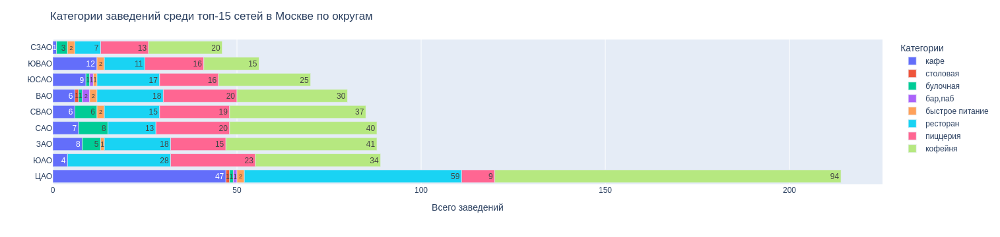

In [41]:
# строим столбчатую диаграмму 
fig = px.bar(chain_top_2.sort_values(by='total_chain_places', ascending=True), 
             x='total_chain_places', 
             y='district', 
             color='category',
             text='total_chain_places'
            )
fig.update_yaxes(categoryorder='total descending')
# оформляем график
fig.update_layout(title='Категории заведений среди топ-15 сетей в Москве по округам',
                   xaxis_title='Всего заведений',
                   yaxis_title='',
                 legend_title='Категории')
fig.show() 

По количеству сетевых заведений:

- определенно лидирует Шоколадница с 120 заведениями.

- Далее следуют Домино'с Пицца, Додо Пицца и One Price Coffee с 76,74 и 71 местами соответственно. 

- Завершает топ Му-Му и его 27 сетевых ресторана.

Почти вдвое от предшественников вырываются кофейни с наибольшим количеством среди общего числа сетевого общепита (336 точек). После них идут рестораны и пиццерии - 186 и 155 заведений. На последнем месте бары(пабы) и столовые, по 4 и 2 сети соответсвенно, запрыгнули в последний вагон, так сказать.

#### Анализ заведений общепита по районам Москвы

In [42]:
places_to_eat_districts = (
    places_to_eat.groupby('district')['name']
    .count().reset_index()
    .sort_values(by='name',ascending=False)
)
places_to_eat_districts.columns = ['district','total']
places_to_eat_districts

,district,total
5,ЦАО,2242
2,САО,900
6,ЮАО,892
3,СВАО,891
1,ЗАО,851
0,ВАО,798
7,ЮВАО,714
8,ЮСАО,709
4,СЗАО,409


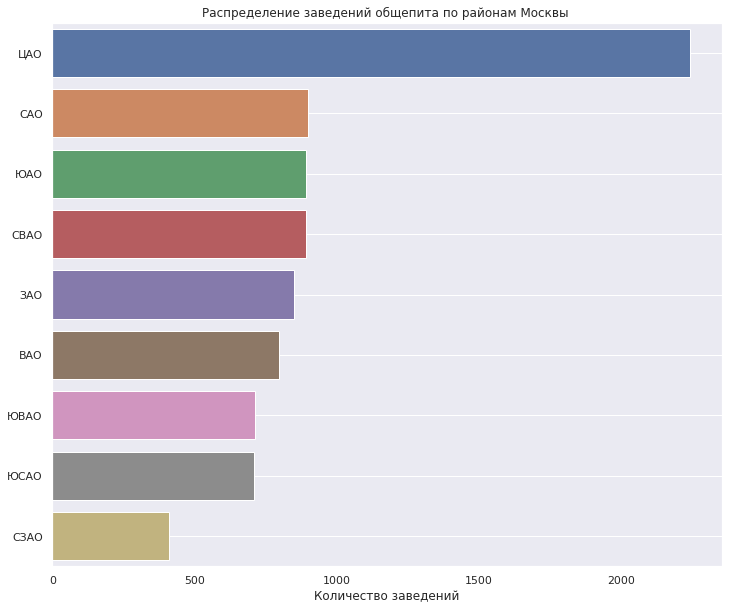

In [43]:
ax = sns.barplot(x='total', y='district', data=places_to_eat_districts) 
sns.set_style('whitegrid')
plt.title('Распределение заведений общепита по районам Москвы ')
plt.xlabel('Количество заведений')
plt.ylabel('')
plt.grid()
plt.show()

In [44]:
places_to_eat_districts_2 = (
    places_to_eat.groupby(['district','category'])['name']
    .count()
    .reset_index()
    .sort_values(by='district',ascending=True)   
)
places_to_eat_districts_2.columns = ['district','category','total']
places_to_eat_districts_2.head(50)

,district,category,total
0,ВАО,"бар,паб",53
1,ВАО,булочная,25
2,ВАО,быстрое питание,71
3,ВАО,кафе,272
4,ВАО,кофейня,105
5,ВАО,пиццерия,72
6,ВАО,ресторан,160
7,ВАО,столовая,40
15,ЗАО,столовая,24
14,ЗАО,ресторан,218


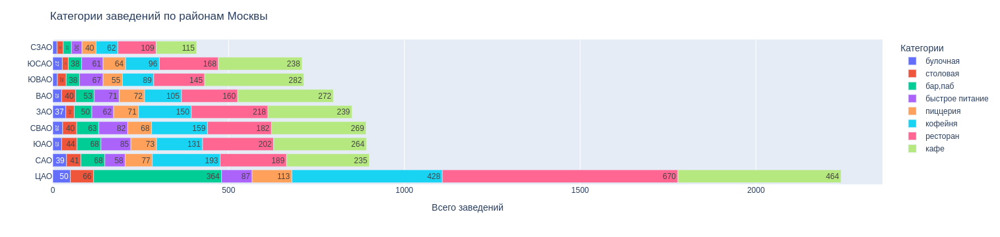

In [45]:
# строим столбчатую диаграмму 
fig = px.bar(places_to_eat_districts_2.sort_values(by='total', ascending=True), 
             x='total', 
             y='district', 
             color='category',
             text='total'
            )
fig.update_yaxes(categoryorder='total descending')
# оформляем график
fig.update_layout(title='Категории заведений по районам Москвы',
                   xaxis_title='Всего заведений',
                   yaxis_title='',
                 legend_title='Категории')

fig.show() 

Исследования показали, что больше всего заведений сосредоточено в ЦАО (26.7% от всех заведений общепита Москвы). Меньше всего подобных заведений находится в СЗАО, всего 409 мест, это 4.9% от от общего количества.

- В ЦАО превалируют рестораны, кафе, кофейни и бары;
- В Восточном и Северо-Восточных административных округах - кафе и рестараны;
- В Серверном большинство представлено кафе и кофейнями;
- В ЮВАО из заведений есть только пиццерии и столовые (судя по нашим данным).

#### Распределение средних рейтингов по категориям заведений

In [46]:
places_to_eat_ratings = (
    places_to_eat.groupby('category')['rating']
    .mean()
    .round(2)
    .reset_index()
    .sort_values(by='rating',ascending=True)
)
places_to_eat_ratings

,category,rating
2,быстрое питание,4.05
3,кафе,4.12
7,столовая,4.21
1,булочная,4.27
4,кофейня,4.28
6,ресторан,4.29
5,пиццерия,4.30
0,"бар,паб",4.39


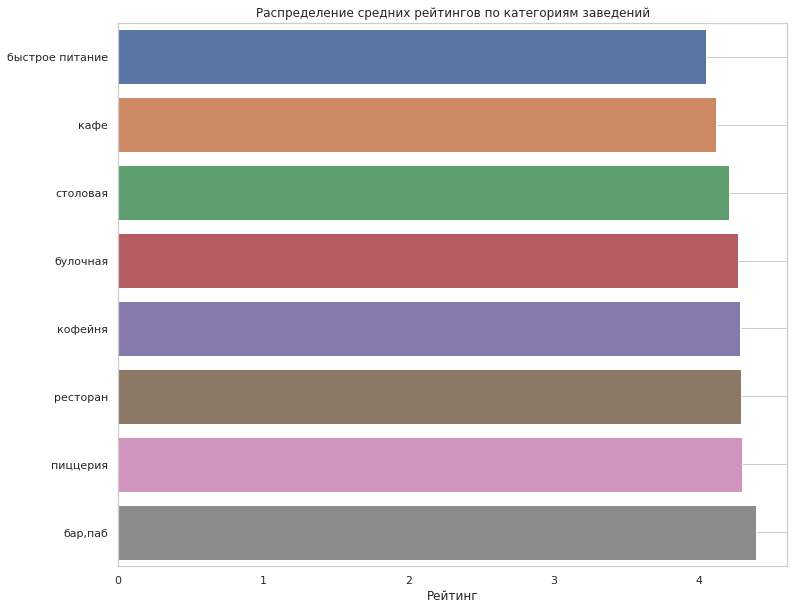

In [47]:
ax = sns.barplot(x='rating', y='category', data=places_to_eat_ratings) 
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Рейтинг')
plt.ylabel('')
plt.grid()
plt.show()

#### Cредний рейтинг заведений районов Москвы

In [48]:
places_to_eat['district'] = places_to_eat['district'].replace(short, long)

In [49]:
rating_district = (
    places_to_eat.groupby('district', as_index=False)['rating']
    .agg('mean')
    .round(2)
    .sort_values(by='rating',ascending=False)
)
rating_district

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [50]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [51]:
from folium import Map, Choropleth

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Средний рейтинг заведений общественного питания существенно выше остальных в ЦАО - 4.4, и незначительно ниже большинства в Северо-Восточном и Юго-Восточном округах - 4.1. В остальных районах средний рейтинг равен 4.1.

In [52]:
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/bubbles/2x/food.png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))

    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

places_to_eat.apply(create_clusters, axis=1)
m

#### Исследование топа-15 улиц по количеству заведений в Москве

In [53]:
top_streets = (
    places_to_eat.pivot_table(index=['street'], values='name', aggfunc='count')
    .reset_index()
    .sort_values(by='name', ascending=False)
    .head(15)
)
top_streets.columns = ['street', 'total']
top_streets

,street,total
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


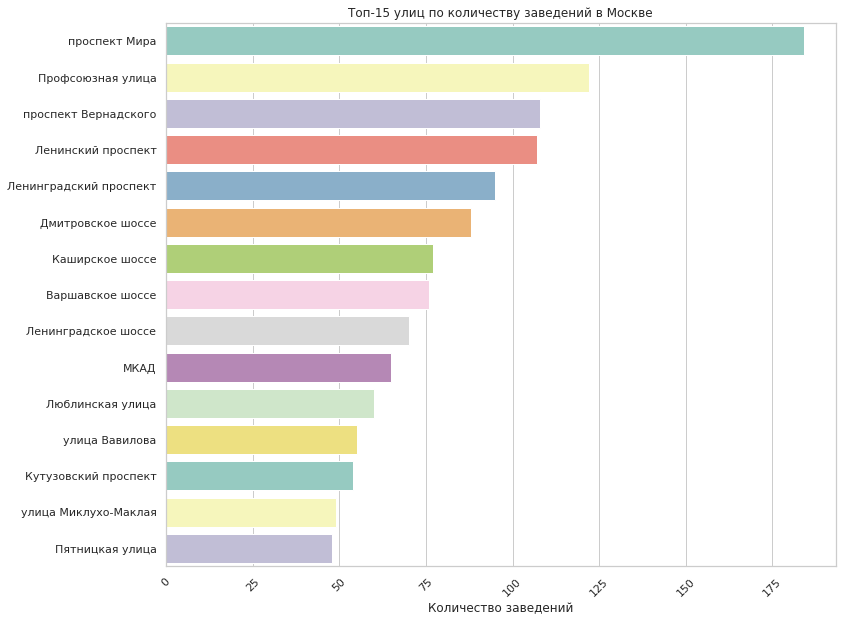

In [54]:
ax = sns.barplot(x='total', y='street', data=top_streets, palette="Set3")
ax.set_xlabel('Количество заведений')
ax.set_ylabel('')
ax.set_title('Топ-15 улиц по количеству заведений в Москве')
plt.xticks(rotation=45)
plt.show()

In [55]:
top = top_streets['street'].unique()

In [56]:
rest = places_to_eat.query('street in @top')

In [57]:
top_streets_2 = (
    rest.groupby(['street','category'])['name']
    .count()
    .reset_index()
    .sort_values(by='street',ascending=True)
)
top_streets_2.columns = ['street','category','total']
top_streets_2.head(10)

,street,category,total
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
5,Варшавское шоссе,ресторан,20
6,Варшавское шоссе,столовая,7
14,Дмитровское шоссе,столовая,4
13,Дмитровское шоссе,ресторан,24
11,Дмитровское шоссе,кофейня,11


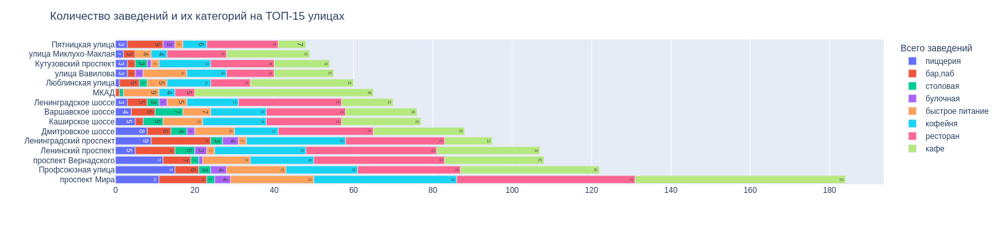

In [58]:
# строим столбчатую диаграмму 
fig = px.bar(top_streets_2.sort_values(by='total', ascending=True), 
             x='total', 
             y='street', 
             color='category',
             text='total'
            )
fig.update_yaxes(categoryorder='total descending')
# оформляем график
fig.update_layout(title='Количество заведений и их категорий на ТОП-15 улицах',
                   xaxis_title='',
                   yaxis_title='',
                 legend_title='Всего заведений')
fig.show() 


Самое большое количество объектов общественного питания в г. Москва находятся на улицах:

 - проспект Мира - 184 места;
 - Профсоюзная - 122;
 - Проспект Вернадского - 108;
 - Ленинский проспект - 107.
 
Интересные наблюдения:
 
 
 - На МКАДЕ кафе почти столько же сколько и на лидере - Проспекте Мира;
 - На Проспекте Мира все заведения являются в основном кафе (54 заведения из 184), ресторанами(45) и кофейнями (36);
 - На Пятницкой, на Вавилова и на Миклухо-Маклае совсем нет ни одной столовой;
 - Большинство кофеен сосредоточены на Проспекте Мира (37 заведений), Ленинградском (35) и Ленинском проспектах(33);
 - Заведения быстрого питания чаще всего открывают на Проспекте Мира, Профсоюзной улице и проспекте Вернадского.
 

#### Анализ улиц, на которых находится только один объект общепита.

In [59]:
lonely_streets = places_to_eat.groupby(['street'])['name'].count().sort_values(ascending=True).reset_index().query('name == 1')
lonely_streets.columns = ['street', 'places_amount']
lonely_streets = lonely_streets.merge(places_to_eat, on='street', how='left')
lonely_streets

,street,places_amount,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7
0,1-й Автозаводский проезд,1,Чайхана Азия,кафе,"Москва, 1-й Автозаводский проезд, 5",Южный административный округ,"ежедневно, круглосуточно",55.704847,37.657065,4.2,средние,Средний счёт:190–350 ₽,270.0,NaN,1,20.0,True
1,Одинцовская улица,1,Монастырская трапеза,столовая,"Москва, Одинцовская улица, 24с18",Северо-Западный административный округ,"ежедневно, 09:00–20:00",55.790620,37.405720,4.5,NaN,NaN,NaN,NaN,1,NaN,False
2,Октябрьский переулок,1,Кампа,ресторан,"Москва, Октябрьский переулок, 12",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.787258,37.612063,4.1,средние,Средний счёт:800 ₽,800.0,NaN,0,48.0,False
3,Ордынский тупик,1,ABC Coffee Roasters,кофейня,"Москва, Ордынский тупик, 4А",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.741026,37.623384,4.5,NaN,NaN,NaN,NaN,1,NaN,False
4,Оренбургская улица,1,Шаурамус,кафе,"Москва, Оренбургская улица, 18",Восточный административный округ,"ежедневно, 09:00–21:00",55.712535,37.862657,3.0,NaN,NaN,NaN,NaN,0,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,3-й Хорошёвский проезд,1,Галерея вкуса,столовая,"Москва, 3-й Хорошёвский проезд, 5, стр. 6",Северный административный округ,пн-пт 09:00–19:00,55.773553,37.535854,4.2,средние,Средний счёт:250–400 ₽,325.0,NaN,1,NaN,False
454,Бобров переулок,1,Ex: Libris,кафе,"Москва, Бобров переулок, 6, стр. 2",Центральный административный округ,"ежедневно, 11:00–23:00",55.764983,37.634254,4.4,средние,Средний счёт:600–800 ₽,700.0,NaN,0,NaN,False
455,Богословский переулок,1,Циники,кофейня,"Москва, Богословский переулок, 8/15с1",Центральный административный округ,пн-чт 09:00–23:00; пт-вс 10:00–23:00,55.762591,37.599530,4.6,средние,Цена чашки капучино:250–350 ₽,NaN,300.0,0,NaN,False
456,4-й Лесной переулок,1,Prime,ресторан,"Москва, 4-й Лесной переулок, 4",Центральный административный округ,пн-пт 08:00–21:00,55.778956,37.587358,4.2,низкие,Средний счёт:300–400 ₽,350.0,NaN,1,220.0,False


In [60]:
lonely_streets = lonely_streets.groupby('street').agg({'category':'first', 'name': 'first'}).reset_index()
lonely_streets.head(10)

,street,category,name
0,1-й Автозаводский проезд,кафе,Чайхана Азия
1,1-й Балтийский переулок,ресторан,Хуан Хэ
2,1-й Варшавский проезд,кафе,Колизей
3,1-й Вешняковский проезд,кафе,Deli by Shell
4,1-й Голутвинский переулок,"бар,паб",Shelby
5,1-й Грайвороновский проезд,"бар,паб",Домашняя кухня
6,1-й Дербеневский переулок,кафе,Жаровня-офис
7,1-й Земельный переулок,ресторан,Арти
8,1-й Капотнинский проезд,кафе,Халал
9,1-й Кирпичный переулок,кафе,Вкус Life


In [61]:
lonely_districts = (lonely_streets.merge(places_to_eat[['street', 'district']], on = 'street', how='left')
                         .drop_duplicates()
                         .reset_index(drop=True))
lonely_districts.groupby(['district'])['name'].count().sort_values(ascending=False).reset_index()

,district,name
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,52
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


In [62]:
lonely_districts.groupby(['category'])['name'].count().sort_values(ascending=False).reset_index()

,category,name
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


Так называемых "одиноких" улиц, на которых находится только один объект общепита, оказалось 458, на этих улицах чаще всего раположены кафе (160 мест), рестораны (93) и кофейни(84). Реже всего встречаются "одинокие" улицы с пиццериями (15 заведений) и булочных(8). Вот уж кто и правда не боится конкуренции.

Почти в три раза обгоняет конкурентов по улицам, на которых находится только один объект общепита, Центральный административный округ - 145 таких улиц. Для примера, следом идет СВАО, но на нем уже только 55.

#### Анализ средних чеков заведений

In [63]:
middle_avg_bill_data = (
    places_to_eat.groupby('district')['middle_avg_bill']
    .median()
    .reset_index()
    .sort_values(by='middle_avg_bill', ascending=False)
)
middle_avg_bill_data

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [64]:
from folium import Map, Choropleth

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_data,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Медиана среднего чека заведений по районам Москвы',
).add_to(m)

m

Анализ показал, что самый высокий средний чек в заведениях Москвы в ЦАО и ЗАО - его медианное значение составляет 1000 рублей в обоих округах, чуть дешевле посетить общепит можно в СЗАО И САО - медиана среднего чека 700 и 650 рублей соответственно. Самые низкие цены в СВАО(500), ЮАО(500) и ЮВАО (450).

### Детализация исследования: открытие кофейни

#### Особенности расположения кофеен

In [65]:
len(places_to_eat[places_to_eat['category'] == 'кофейня'])

1413

In [66]:
coffee_shops = (
    places_to_eat
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(count_object=('name', 'count'))
    .sort_values(by='count_object', ascending=False)
)
coffee_shops.columns = ['district', 'coffee_shop']
coffee_shops 

# посмотрим, как распределены кофейни по округам

,district,coffee_shop
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [67]:
from folium import Map, Choropleth

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_shops,
    columns=['district', 'coffee_shop'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Количество кофеен',
).add_to(m)

m

#### Анализ круглосуточных кофеен

In [68]:
coffee_shops_24_7 = (
    coffee_shops.merge(places_to_eat, on='district', how='left')
    .query('is_24_7 == True')
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(count_object=('name', 'count'))
    .sort_values(by='count_object', ascending=False)
)
coffee_shops_24_7.columns = ['district', '24_7']
coffee_shops_24_7

# посмотрим распределение круглосуточных кофеен по кругам

,district,24_7
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [69]:
coffee_shops_24_7['24_7'].sum()

59

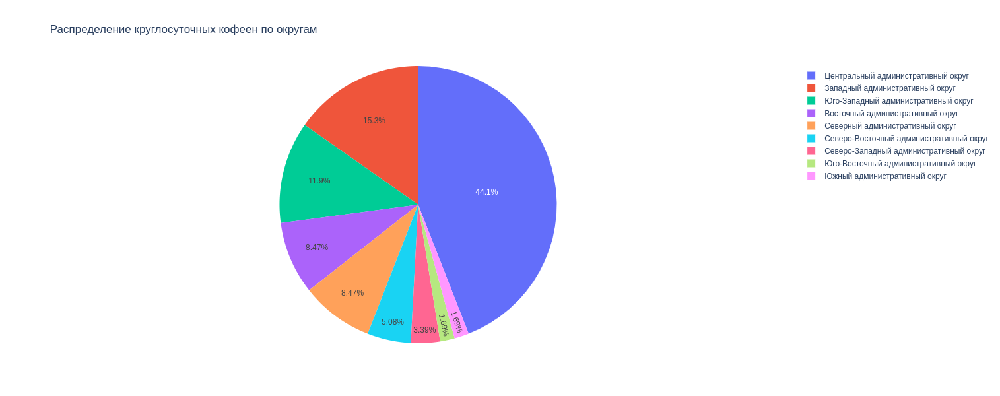

In [70]:
categories = coffee_shops_24_7['district']
total = coffee_shops_24_7['24_7']

fig = go.Figure(data=[go.Pie(labels=categories, values=total)])
fig.update_layout(title='Распределение круглосуточных кофеен по округам', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='',
                                    showarrow=False)])
fig.show() 

#### Анализ рейтингов кофеен

In [71]:
(
    places_to_eat
    .query('category == "кофейня"')
    .groupby(['category'])['rating']
    .median()
    .reset_index()
)
# найдем медианное значение рейтинга всех кофеен

,category,rating
0,кофейня,4.3


In [72]:
rating_price = (
    places_to_eat.query('category == "кофейня"')
    .groupby(['price'])['rating']
    .median()
    .reset_index()
    .sort_values(by='rating',ascending=False)
)
rating_price

,price,rating
0,высокие,4.40
1,выше среднего,4.35
2,низкие,4.30
3,средние,4.30


In [73]:
cup_price_rating = (
    places_to_eat.query('category == "кофейня"')
    .groupby(['rating'])['middle_coffee_cup']
    .median()
    .reset_index()
    .sort_values(by='rating',ascending=False)
)
cup_price_rating.head(10) 

,rating,middle_coffee_cup
27,5.0,160.0
26,4.9,150.0
25,4.8,185.0
24,4.7,179.0
23,4.6,184.0
22,4.5,174.5
21,4.4,177.5
20,4.3,168.5
19,4.2,172.0
18,4.1,171.0


В среднем чашка капучино в заведениях с хорошим рейтингом (4.8 - 5.0) стоит в среднем 150-185 рублей.

А теперь посмотрим есть ли зависимость между стоимостью чашки капучино и рейтингом заведения. Но для анализа возьмём данные из основной таблицы.

In [74]:
places_to_eat['rating'].corr(places_to_eat['middle_coffee_cup']).round(2)

# посмотрим есть ли зависимость между рейтингом и стоимостью чашки каппучино

0.1

Корреляция не прослеживается, поэтому справедливо сказать, что стоимость чашки капучино никак не влияет на рейтинг.

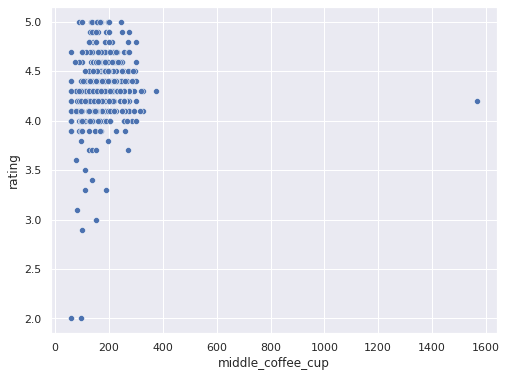

In [75]:
sns.set_style('whitegrid')
sns.set(rc={'figure.figsize':(8, 6)})
sns.scatterplot(x='middle_coffee_cup', y='rating', data=places_to_eat)
plt.show()

In [76]:
coffee_shops_rating = (
    coffee_shops.merge(places_to_eat, on='district', how='inner')
    .groupby('district')['rating']
    .mean()
    .round(1)
    .reset_index()
    .sort_values(by='rating', ascending=False) 
)
coffee_shops_rating

# посмотрим зависит ли рейтинг кофейни от административного округа

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.2
1,Западный административный округ,4.2
2,Северный административный округ,4.2
4,Северо-Западный административный округ,4.2
7,Юго-Западный административный округ,4.2
8,Южный административный округ,4.2
3,Северо-Восточный административный округ,4.1
6,Юго-Восточный административный округ,4.1


In [77]:
from folium import Map, Choropleth

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_shops_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Рейтинг кофеен',
).add_to(m)

m

In [78]:
bad_rating = (
    places_to_eat.query('category == "кофейня"')
    .groupby(['name','district'])['rating']
    .median()
    .reset_index()
    .sort_values(by='rating', ascending=True)
    .head(10)
)
bad_rating # найдем ТОП-10 кофеен с самым низким рейтингом

,name,district,rating
804,Маракуйя,Северо-Восточный административный округ,1.4
502,Wild Bean Cafe,Юго-Восточный административный округ,2.3
351,Monty Cafe,Северный административный округ,2.3
93,Cinnabon,Северо-Восточный административный округ,2.6
741,Кофейня,Юго-Восточный административный округ,2.8
143,Coffee Music,Западный административный округ,2.9
981,Шкафе Бульон,Юго-Восточный административный округ,2.9
257,Gold,Восточный административный округ,3.0
188,Coffprice,Северный административный округ,3.0
656,Кафе,Западный административный округ,3.1


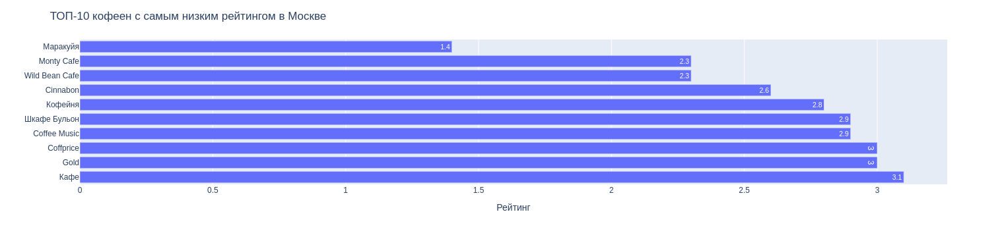

In [79]:
# строим столбчатую диаграмму 
fig = px.bar(bad_rating.sort_values(by='rating', ascending=False), 
             x='rating', 
             y='name',
             text='rating'                      
            )
# оформляем график
fig.update_layout(title='ТОП-10 кофеен с самым низким рейтингом в Москве',
                   xaxis_title='Рейтинг',
                   yaxis_title='')
fig.show() 

In [80]:
best_rating = (
    places_to_eat.query('category == "кофейня"')
    .groupby(['name','district'])['rating']
    .median()
    .reset_index()
    .sort_values(by='rating', ascending=False)
    
)
best_rating.head(40) # найдем кофеени с самым высоким рейтингом

,name,district,rating
319,La Vie Café,Центральный административный округ,5.0
626,За Думой,Центральный административный округ,5.0
45,Big Black Cup coffee,Юго-Восточный административный округ,5.0
511,Youtime,Восточный административный округ,5.0
57,Booblik,Северный административный округ,5.0
60,Bread Head,Северо-Западный административный округ,5.0
282,Illy,Северо-Западный административный округ,5.0
574,"Винотека, булочная, кулинария Вино & кухня",Западный административный округ,5.0
276,I-cup,Северный административный округ,5.0
914,Стамбул Дурум,Северо-Западный административный округ,5.0


У 33 кофеен рейтинг составляет 5.0. возьмём эти кофейни за образец и попробуем выявить, что у них общего.

In [81]:
rtg_33 = best_rating.head(33)

In [82]:
top_rat = rtg_33['rating']

In [83]:
best_33 = places_to_eat.query('category == "кофейня"').query('rating  in @top_rat').head(33)
best_33 = best_33[['name', 'district', 'chain', 'is_24_7', 'middle_coffee_cup']]
best_33

,name,district,chain,is_24_7,middle_coffee_cup
3,Dormouse Coffee Shop,Северный административный округ,0,False,170.0
324,Иду лесом,Северо-Западный административный округ,0,False,165.0
392,Кеклик,Северный административный округ,0,False,NaN
610,Напитки со всего мира,Северный административный округ,0,False,NaN
1272,Уголок,Северный административный округ,1,False,NaN
1283,Pique-Nique,Северный административный округ,0,False,195.0
1284,Стамбул Дурум,Северо-Западный административный округ,0,False,NaN
1296,Bread Head,Северо-Западный административный округ,0,False,NaN
1307,Nero Bean Coffee Roastery,Северный административный округ,0,False,200.0
1569,Дайтекофе,Северный административный округ,0,False,NaN


In [84]:
best_33['district'].value_counts().reset_index()

,index,district
0,Северный административный округ,13
1,Центральный административный округ,5
2,Восточный административный округ,4
3,Северо-Западный административный округ,4
4,Западный административный округ,2
5,Юго-Восточный административный округ,2
6,Северо-Восточный административный округ,1
7,Южный административный округ,1
8,Юго-Западный административный округ,1


In [85]:
best_33['chain'].value_counts() 

# посмотрим, сколько кофеен из топа-33 являются сетевыми

0    26
1     7
Name: chain, dtype: int64

In [86]:
best_33['is_24_7'].value_counts() 

# посмотрим, сколько кофеен из топа-33 являются круглосуточными

False    32
True      1
Name: is_24_7, dtype: int64

In [87]:
best_cup_price = (
    best_33.groupby(['middle_coffee_cup'])
    .median()
    .reset_index()
    .sort_values(by='middle_coffee_cup', ascending=True)
)
# посмотрим на стоимость чашки капучино в заведениях с рейтингом 5.0

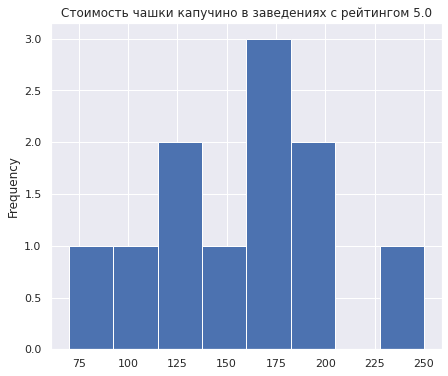

In [88]:
best_cup_price['middle_coffee_cup'].plot(title='Стоимость чашки капучино в заведениях с рейтингом 5.0', kind='hist', bins=8, range=(70, 250), grid=True, figsize=(7,6));

In [89]:
steerts_without_coffee_shops = lonely_streets[lonely_streets['category'] != 'кофейня']['street']
steerts_without_coffee_shops.reset_index()

# найдем список улиц, на которых находится всего одно заведение общепита, и это не кофейня

,index,street
0,0,1-й Автозаводский проезд
1,1,1-й Балтийский переулок
2,2,1-й Варшавский проезд
3,3,1-й Вешняковский проезд
4,4,1-й Голутвинский переулок
...,...,...
369,452,улица Чистова
370,453,улица Шкулёва
371,455,улица Шухова
372,456,улица Юннатов


Исследование кофеен города Москвы, выявило следующие особенности:

- всего в Москве 1413 кофеен;
- больше всего кофеен расположено в ЦАО - 428 заведения, это 30% от всех кофеен Москвы, далее следуют САО и СВАО - 193 и 159 кофеен соответственно; меньше всего кофеен в СЗАО  - 62 места;
- из 1413 всех кофеен круглосуточно работает половина - 730 заведений, больше всего в ЦАО - 131 кофейня, меньше всего в СЗАО - всего 43;
- средний рейтинг кофеен Москвы по сравнению с другими заведениями - 4.3;
- самый высокий рейтинг в кофейнях ЦАО - 4.4, самый низкий в ЮВАО и СВАО - 4.1;
- кофейня с самым низким рейтингом Москвы называеься Маракуйя - рейтинг 1.4, недалеко ушли Wild Bean Cafe и Monte Cafe, их рейтинг составляет 2.3;
- 33 кофейни в Москве имеют рейтиг 5.0;
- средняя чашка капучино в заведениях с хорошим рейтингом (4.8 - 5.0) стоит в среднем 150-185 рублей;
- коэфициент корреляции между рейтингом и стоимостью чашки капучино составляет 0.1, это значит, что как правило, что стоимость чашки капучино никак не влияет на рейтинг;
- там где указан диапазон цен "высокие" средний рейтинг составляет 4.4, "выше среднего - 4.35", " низкие" и "средние" - 4.3.

В ходе анализа было найдено 33 кофеени с наивысшим рейтингом, которые были взяты за образец. При исследовании этих заведений было выявлено ряд особенностей:

- 26 кофеен с рейтингом 5.0 - несетевые;
- только одна кофейня является круглосуточной;
- 13 из 33 заведений находятся в Северном административном округе;
- стоимость чашки капучино в этих кофейнях чаще всего составляет от 125 до 245 рублей.

Во время исследовния был сформирован список улиц, на которых находится всего одно заведение общепита, и это не кофейня, возможно эта информация будет полезна инвесторам при выборе места для открытия кофейни.

Рекоммендации по открытию кофейни похожей на Central Perk:

1. По возможности посетите топ кофеен Москвы с самым высоким рейтингом.
2. Как правило в заведениях с хорошим рейтингом кофе не стоит очень дешево, придерживайтесь ценовой политики за чашку капучино от 125 до 245 рублей.
3. Сразу открыть круглосуточную кофейню будет непросто, а вот удержать высокий рейтинг еще сложнее, поэтому необязательно открывать кофейню 24/7.
4. В САО много кофеен с высоким рейтингом, а значит большая конкуренция, а вот в СВАО и ЮВАО их меньше, возможно это шанс.
5. Просмотрите список улиц, на которых всего одно заведение общепита и ни одной кофейни, может быть одна из них окажется подходящим местом.

### Общий вывод

В ходе исследования рынка заведений общественного питания Москвы, были найдены интересные особенности, которые в будущем могут помочь в выборе подходящего инвесторам места для открытия кафе, ресторана, пиццерии, паба или бара. Помимо этого исследование было детализировано более глубоким анализом рынка кофеен Москвы, результатом которого стали рекоммендации по открытию кофейни похожей на Central Perk. 

Интересные особенности всех заведений общественного питания Москвы:

- Общее количество заведений общепита Москвы - 8406;
- Среди категорий заведений общественного питания Москвы лидерами по количеству стали: кафе(28.3% и 2374 места), рестораны(24.3% и 2043 мест) и кофейни(16.8%  и 1413 места). А вот булочных в Москве всего 256, а это лишь 3% от всех заведений. Да уж, это Вам не Санкт-Петербург;
- Больше всего заведений сосредоточено в ЦАО (26.7% от всех заведений общепита Москвы). Меньше всего подобных заведений находится в СЗАО, всего 409 мест, это 4.9% от от общего количества;
- В ЦАО превалируют рестораны, кафе, кофейни и бары;
- В Восточном и Северо-Восточных административных округах - кафе и рестараны;
- В Серверном большинство представлено кафе и кофейнями;
- В ЮВАО из заведений есть только пиццерии и столовые (судя по нашим данным);
- Самое большое количество объектов общественного питания в г. Москва находятся на улицах: проспект Мира - 184 места, Профсоюзная - 122, Проспект Вернадского - 108, и Ленинский проспект - 107;
 - На МКАДЕ кафе почти столько же сколько и на лидере - Проспекте Мира;
 - На Проспекте Мира все заведения являются в основном кафе (54 заведения из 184), ресторанами(45) и кофейнями (36);
 - На Пятницкой, на Вавилова и на Миклухо-Маклае совсем нет ни одной столовой;
 - Большинство кофеен сосредоточены на Проспекте Мира (37 заведений), Ленинградском (35) и Ленинском проспектах(33);
 - Заведения быстрого питания чаще всего открывают на Проспекте Мира, Профсоюзной улице и проспекте Вернадского;
 - Так называемых "одиноких" улиц, на которых находится только один объект общепита, оказалось 458, на этих улицах чаще всего раположены кафе (160 мест), рестораны (93) и кофейни(84). Реже всего встречаются "одинокие" улицы с пиццериями (15 заведений) и булочных(8). Вот уж кто и правда не боится конкуренции;
- Почти в три раза обгоняет конкурентов по улицам, на которых находится только один объект общепита, Центральный административный округ - 145 таких улиц. Для примера, следом идет СВАО, но на нем уже только 55;
- Средний чек в основном не превышает 4000 рублей;
- Самый высокий средний чек в заведениях Москвы в ЦАО и ЗАО - его медианное значение составляет 1000 рублей в обоих округах, чуть дешевле посетить общепит можно в СЗАО И САО - медиана среднего чека 700 и 650 рублей соответственно. Самые низкие цены в СВАО(500), ЮАО(500) и ЮВАО (450);
- В среднем чашка капучино стоит не дороже 200 рублей;
- Несетевые заведения превалируют над сетевыми, лишь 40% заведений общественного питания являются сетевыми, это 3205 места;
- Чаще всего сетевыми заведениями в Москве являются кафе (779 заведений), рестораны (730) и кофейни (720), это 9% от общего количества заведений общепита Москвы. 4% сетевых мест - это пиццерии, а вот сетевых столовых в Москве 88, это 1% от всех имеющихся мест общепита;
- По количеству сетевых заведений определенно лидирует Шоколадница с 120 заведениями, далее следуют Домино'с Пицца, Додо Пицца и One Price Coffee с 76,74 и 71 местами соответственно. Завершает топ Му-Му и его 27 сетевых ресторана;
- Рейтинг большинства заведений находится в районе 4.5;
- Усредненные рейтинги по категориям заведений не сильно отличаются, максимальный - у баров и пабов - 4.4, минимальный - у кафе и заведений быстрого питания - 4.1;
- Средний рейтинг заведений общественного питания существенно выше остальных в ЦАО - 4.4, и незначительно ниже большинства в Северо-Восточном и Юго-Восточном округах - 4.1. В остальных районах средний рейтинг равен 4.1;
- В большинстве мест количество посадочных мест в районе 100;
- Суммарно общее количество посадочных мест больше в ресторанах и кафе, меньше всего в булочных и столовых. Анализируя медианные значения посадочных мест в каждой категории, было выявлено, что больше всего посадочных мест обычно в ресторанах, пабах и кофейнях - в среднем 86, 82 и 80 мест соответственно. В столовых, заведениях быстрого питания и кафе чуть меньше - 76, 65 и 60 соответственно. В пиццериях и булочных мест меньше всего - 55 и 50;

Интересные особенности кофеен Москвы:

- всего в Москве 1413 кофеен;
- больше всего кофеен расположено в ЦАО - 428 заведения, это 30% от всех кофеен Москвы, далее следуют САО и СВАО - 193 и 159 кофеен соответственно; меньше всего кофеен в СЗАО  - 62 места;
- из 1413 всех кофеен круглосуточно работает половина - 730 заведений, больше всего в ЦАО - 131 кофейня, меньше всего в СЗАО - всего 43;
- средний рейтинг кофеен Москвы по сравнению с другими заведениями - 4.3;
- самый высокий рейтинг в кофейнях ЦАО - 4.4, самый низкий в ЮВАО и СВАО - 4.1;
- кофейня с самым низким рейтингом Москвы называется Маракуйя - рейтинг 1.4, недалеко ушли Wild Bean Cafe и Monte Cafe, их рейтинг составляет 2.3;
- средняя чашка капучино в заведениях с хорошим рейтингом (4.8 - 5.0) стоит в среднем 150-185 рублей;
- коэфициент корреляции между рейтингом и стоимостью чашки капучино составляет 0.1, это значит, что как правило, что стоимость чашки капучино никак не влияет на рейтинг;
- там где указан диапазон цен "высокие" средний рейтинг составляет 4.4, "выше среднего - 4.35", " низкие" и "средние" - 4.3.
- 33 кофейни в Москве имеют рейтиг 5.0 (26 из них - несетевые; только одна кофейня является круглосуточной; 13 из 33 заведений находятся в Северном административном округе; стоимость чашки капучино в этих кофейнях чаще всего составляет от 125 до 245 рублей).

Рекомендации по открытию кофейни похожей на Central Perk:

- По возможности посетите топ кофеен Москвы с самым высоким рейтингом.
- Как правило в заведениях с хорошим рейтингом кофе не стоит очень дешево, придерживайтесь ценовой политики за чашку капучино от 125 до 245 рублей.
- Сразу открыть круглосуточную кофейню будет непросто, а вот удержать высокий рейтинг еще сложнее, поэтому необязательно открывать кофейню 24/7.
- В САО много кофеен с высоким рейтингом, а значит большая конкуренция, а вот в СВАО и ЮВАО их меньше, возможно это шанс.
- Просмотрите список улиц (в данном проекте он называется steerts_without_coffee_shops), на которых всего одно заведение общепита и ни одной кофейни, может быть одна из них окажется подходящим местом.


Презентация: <https://disk.yandex.ru/i/iXcTNL2Q3qLeOA> 